# Week 7 - Spatial Autocorrelation

**Author:** Elise Chessman

For my midterm assignment, I had already dissolved my historic mine data to the county level, reset that index, and then joined this back to my counties that I had identified as rent burdened.  While I made a map that showed the historic mine points by clusters, I think it makes sense to do some spatial autocorrelation analysis. However, I'm going to work with all counties rather than just my rent burdened ones, so I'll redo my join to all of my county layers. I'll start by bringing in the data and the libraries that I need.

I'lll go back to my ACS 2019 data that shows rent as a percentage of income at the county level. 

I'll start by just looking at total population, so I'll clean up my data to just include the county name, geometry, and total pop. value.


In [1]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
gdf = gpd.read_file('acs2019_5yr_B25070_05000US08045.geojson')
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 65 entries, 0 to 64
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geoid             65 non-null     object  
 1   name              65 non-null     object  
 2   B25070001         65 non-null     float64 
 3   B25070001, Error  65 non-null     float64 
 4   B25070002         65 non-null     float64 
 5   B25070002, Error  65 non-null     float64 
 6   B25070003         65 non-null     float64 
 7   B25070003, Error  65 non-null     float64 
 8   B25070004         65 non-null     float64 
 9   B25070004, Error  65 non-null     float64 
 10  B25070005         65 non-null     float64 
 11  B25070005, Error  65 non-null     float64 
 12  B25070006         65 non-null     float64 
 13  B25070006, Error  65 non-null     float64 
 14  B25070007         65 non-null     float64 
 15  B25070007, Error  65 non-null     float64 
 16  B25070008         65

In [3]:
gdf = gdf[['geoid','name','B25070001','geometry']]

# rename the columns
gdf.columns = ['FIPS','County','TotalPop','geometry']

In [4]:
gdf.head()

,FIPS,County,TotalPop,geometry
0,04000US08,Colorado,747259.0,"MULTIPOLYGON (((-109.05095 40.22265, -109.0509..."
1,05000US08001,"Adams County, CO",56242.0,"MULTIPOLYGON (((-104.60700 39.89941, -104.6071..."
2,05000US08003,"Alamosa County, CO",2600.0,"MULTIPOLYGON (((-106.03930 37.57699, -106.0393..."
3,05000US08005,"Arapahoe County, CO",87669.0,"MULTIPOLYGON (((-104.79137 39.56609, -104.7928..."
4,05000US08007,"Archuleta County, CO",1628.0,"MULTIPOLYGON (((-107.25497 37.00002, -107.2553..."


I'll drop the first row that is for the entire state of Colorado:

In [5]:
gdf=gdf.drop(0)

In [6]:
gdf.head()

,FIPS,County,TotalPop,geometry
1,05000US08001,"Adams County, CO",56242.0,"MULTIPOLYGON (((-104.60700 39.89941, -104.6071..."
2,05000US08003,"Alamosa County, CO",2600.0,"MULTIPOLYGON (((-106.03930 37.57699, -106.0393..."
3,05000US08005,"Arapahoe County, CO",87669.0,"MULTIPOLYGON (((-104.79137 39.56609, -104.7928..."
4,05000US08007,"Archuleta County, CO",1628.0,"MULTIPOLYGON (((-107.25497 37.00002, -107.2553..."
5,05000US08009,"Baca County, CO",482.0,"MULTIPOLYGON (((-102.84192 36.99960, -102.8419..."


In [7]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 64 entries, 1 to 64
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FIPS      64 non-null     object  
 1   County    64 non-null     object  
 2   TotalPop  64 non-null     float64 
 3   geometry  64 non-null     geometry
dtypes: float64(1), geometry(1), object(2)
memory usage: 2.5+ KB


### Map the Counties

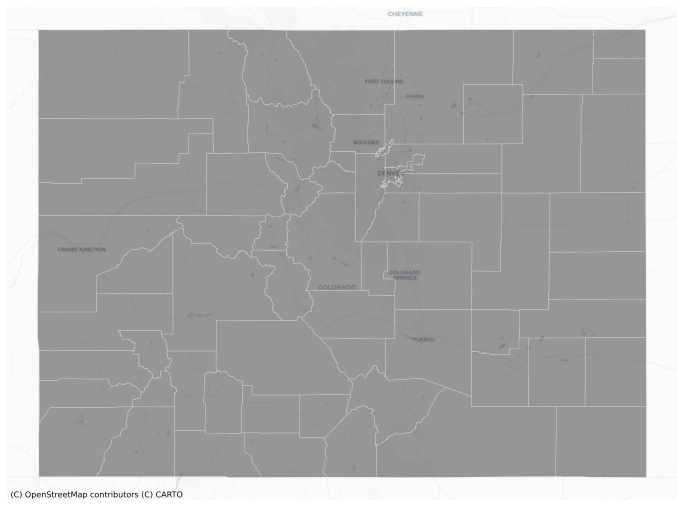

In [8]:
# get the layers into a web mercator projection
# reproject to web mercator
gdf = gdf.to_crs(epsg=3857)

# plot it!
fig, ax = plt.subplots(figsize=(12,12))

gdf.plot(ax=ax,
         color='black', 
         edgecolor='white',
         lw=0.5,
         alpha=0.4)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

Now I'll go ahead and bring in my historic mine data. I'll bring that back in and show that process. Previously I had joined this just to my rent burdened counties, but I'll go back to join it to all of my counties to look at spatial clusters for the whole state. 

In [9]:
hist_gdf = gpd.read_file("historic_mines.geojson")
hist_gdf["Count"] = 1
hist_gdf.head()

,STATE,COUNTY,FTR_TYPE,FTR_NAME,FTR_AZIMUT,TOPO_NAME,TOPO_DATE,TOPO_SCALE,COMPILEDBY,REMARKS,GDA_ID,SCANID,geometry,Count
0,CO,Jackson,Coal Mine,None,0.0,Coalmont,1955,24000,USGS,None,5348207.0,232591.0,POINT (-106.49284 40.50346),1
1,CO,Jackson,Coal Mine,None,0.0,Coalmont,1955,24000,USGS,None,5348207.0,232591.0,POINT (-106.49473 40.50247),1
2,CO,Jackson,Coal Mine,None,0.0,Coalmont,1955,24000,USGS,None,5348207.0,232591.0,POINT (-106.49403 40.50049),1
3,CO,Garfield,Coal Mine,None,0.0,Rifle,1952,24000,USGS,Labeled as inactive.,5355287.0,451611.0,POINT (-107.76933 39.59839),1
4,CO,Weld,Coal Mine,None,0.0,Milton Reservoir,1950,24000,USGS,Labeled as inactive.,5353203.0,451273.0,POINT (-104.74284 40.22302),1


In [10]:
columns_to_keep = ["COUNTY", "FTR_TYPE", "TOPO_DATE", "geometry", "Count"]
hist_gdf = hist_gdf[columns_to_keep]

Before, I had used "dissolve" to get the count data by county, and then plotted those in a bar chart. Here's how I did that: 

In [11]:
histcounties_gdf = hist_gdf.dissolve(by='COUNTY', aggfunc='sum')
histcounties_gdf.head()

,geometry,TOPO_DATE,Count
COUNTY,,,
Adams,"MULTIPOINT (-104.15806 39.98222, -104.15521 39...",3902,2
Archuleta,"MULTIPOINT (-107.47515 37.29602, -107.45134 37...",9844,5
Baca,"MULTIPOINT (-102.91875 37.52742, -102.78975 37...",3950,2
Bent,"MULTIPOINT (-103.35947 38.11065, -103.27756 37...",21582,11
Boulder,"MULTIPOINT (-105.65902 40.01106, -105.61338 39...",803255,410


It looks like it also created a sum for the date of the map, but I'll disregard that for now since I'm mostly interested in the count. Now I'll join my count per county data back to my county outline gdf from earlier. I'll make sure to reset the index as well so I don't lose my county info.

In [12]:
histcounties_gdf.reset_index(level=0, inplace=True)

However, since I did not do this as a sum based on FIPS, I'll go back and follow the way it was done in last week's lab.

In [13]:
hist_gdf = hist_gdf.to_crs(epsg=3857)

In [14]:
join = gpd.sjoin(hist_gdf, gdf, how='left')
join.head()

,COUNTY,FTR_TYPE,TOPO_DATE,geometry,Count,index_right,FIPS,County,TotalPop
0,Jackson,Coal Mine,1955,POINT (-11854728.322 4939375.712),1,30,05000US08057,"Jackson County, CO",112.0
1,Jackson,Coal Mine,1955,POINT (-11854939.167 4939231.492),1,30,05000US08057,"Jackson County, CO",112.0
2,Jackson,Coal Mine,1955,POINT (-11854861.292 4938940.552),1,30,05000US08057,"Jackson County, CO",112.0
3,Garfield,Coal Mine,1952,POINT (-11996826.953 4807751.478),1,24,05000US08045,"Garfield County, CO",7124.0
4,Weld,Coal Mine,1950,POINT (-11659920.135 4898403.864),1,63,05000US08123,"Weld County, CO",28350.0


In [15]:
mines_by_county = join.FIPS.value_counts().rename_axis('FIPS').reset_index(name='mines_count')

In [16]:
mines_by_county.head()

,FIPS,mines_count
0,05000US08047,1085
1,05000US08019,557
2,05000US08065,545
3,05000US08013,410
4,05000US08051,278


In [17]:
gdf=gdf.merge(mines_by_county,on='FIPS')
gdf.head()

,FIPS,County,TotalPop,geometry,mines_count
0,05000US08001,"Adams County, CO",56242.0,"MULTIPOLYGON (((-11644798.307 4851335.999, -11...",2
1,05000US08007,"Archuleta County, CO",1628.0,"MULTIPOLYGON (((-11939568.534 4439109.575, -11...",5
2,05000US08009,"Baca County, CO",482.0,"MULTIPOLYGON (((-11448310.278 4439051.033, -11...",2
3,05000US08011,"Bent County, CO",714.0,"MULTIPOLYGON (((-11484054.076 4617066.888, -11...",11
4,05000US08013,"Boulder County, CO",48142.0,"MULTIPOLYGON (((-11760745.906 4874953.136, -11...",410


## Normalizing the data

Now I'll normalize my mine data by population.

In [19]:
gdf['mines_per_1000'] = gdf['mines_count']/gdf['TotalPop']*1000
gdf.head()

,FIPS,County,TotalPop,geometry,mines_count,mines_per_1000
0,05000US08001,"Adams County, CO",56242.0,"MULTIPOLYGON (((-11644798.307 4851335.999, -11...",2,0.035561
1,05000US08007,"Archuleta County, CO",1628.0,"MULTIPOLYGON (((-11939568.534 4439109.575, -11...",5,3.071253
2,05000US08009,"Baca County, CO",482.0,"MULTIPOLYGON (((-11448310.278 4439051.033, -11...",2,4.149378
3,05000US08011,"Bent County, CO",714.0,"MULTIPOLYGON (((-11484054.076 4617066.888, -11...",11,15.406162
4,05000US08013,"Boulder County, CO",48142.0,"MULTIPOLYGON (((-11760745.906 4874953.136, -11...",410,8.516472


In [21]:
gdf.sort_values(by="mines_per_1000").tail()

,FIPS,County,TotalPop,geometry,mines_count,mines_per_1000
7,05000US08019,"Clear Creek County, CO",1001.0,"MULTIPOLYGON (((-11769155.760 4839677.217, -11...",557,556.443556
22,05000US08057,"Jackson County, CO",112.0,"MULTIPOLYGON (((-11897072.541 5008453.757, -11...",142,1267.857143
29,05000US08079,"Mineral County, CO",49.0,"MULTIPOLYGON (((-11927297.119 4534670.858, -11...",67,1367.346939
17,05000US08047,"Gilpin County, CO",572.0,"MULTIPOLYGON (((-11766556.672 4848362.977, -11...",1085,1896.853147
43,05000US08111,"San Juan County, CO",108.0,"MULTIPOLYGON (((-12019728.698 4534831.774, -12...",257,2379.629630


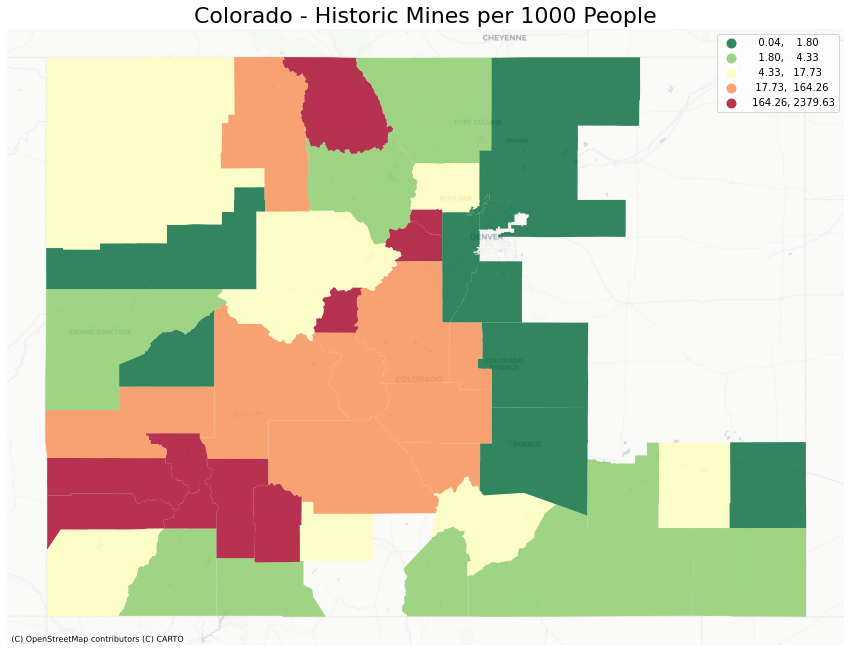

In [22]:
fig,ax = plt.subplots(figsize=(15,15))

gdf.plot(ax=ax,
        column='mines_per_1000',
        legend=True,
        alpha=0.8,
        cmap='RdYlGn_r',
        scheme='quantiles')

ax.axis('off')
ax.set_title('Colorado - Historic Mines per 1000 People',fontsize=22)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Spatial Lag

I'll now calculate Spatial Lag, which as we learned in class, takes the average of all the neighbors as defined by the spatial weight to come up with a single associated value.

In [24]:
wq =  lps.weights.KNN.from_dataframe(gdf,k=8)

# Row-standardization
wq.transform = 'r'

In [25]:
gdf['mines_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf['mines_per_1000'])

In [27]:
gdf.sample(10)[['FIPS','TotalPop','mines_count','mines_per_1000','mines_per_1000_lag']]

,FIPS,TotalPop,mines_count,mines_per_1000,mines_per_1000_lag
45,05000US08117,3671.0,65,17.706347,386.388048
39,05000US08103,672.0,3,4.464286,12.283492
42,05000US08109,815.0,98,120.245399,251.043723
37,05000US08099,1690.0,2,1.183432,20.029805
8,05000US08023,541.0,1,1.848429,209.852339
0,05000US08001,56242.0,2,0.035561,308.403399
14,05000US08041,92830.0,55,0.592481,37.354416
23,05000US08059,68098.0,114,1.674058,325.934483
12,05000US08035,25365.0,45,1.774098,322.722631
21,05000US08055,911.0,11,12.074643,38.104367


## A donut and a diamond

In [28]:
gdf['mines_lag_diff'] = gdf['mines_per_1000'] - gdf['mines_per_1000_lag']

In [29]:
gdf.sort_values(by='mines_lag_diff')

,FIPS,County,TotalPop,geometry,mines_count,mines_per_1000,mines_per_1000_lag,mines_lag_diff
25,05000US08067,"La Plata County, CO",6394.0,"MULTIPOLYGON (((-12055362.512 4469118.794, -12...",17,2.658743,575.357515,-572.698773
1,05000US08007,"Archuleta County, CO",1628.0,"MULTIPOLYGON (((-11939568.534 4439109.575, -11...",5,3.071253,540.987136,-537.915883
40,05000US08105,"Rio Grande County, CO",1774.0,"MULTIPOLYGON (((-11824647.079 4543901.935, -11...",10,5.636979,528.529208,-522.892230
18,05000US08049,"Grand County, CO",1856.0,"MULTIPOLYGON (((-11809866.967 4916943.498, -11...",7,3.771552,472.606737,-468.835185
26,05000US08069,"Larimer County, CO",47903.0,"MULTIPOLYGON (((-11780102.696 4935477.647, -11...",129,2.692942,467.061163,-464.368221
31,05000US08083,"Montezuma County, CO",2972.0,"MULTIPOLYGON (((-12099845.669 4527501.367, -12...",13,4.374159,409.587581,-405.213422
32,05000US08085,"Montrose County, CO",4685.0,"MULTIPOLYGON (((-12087480.189 4650300.130, -12...",201,42.902882,417.574756,-374.671875
45,05000US08117,"Summit County, CO",3671.0,"MULTIPOLYGON (((-11819636.811 4809292.940, -11...",65,17.706347,386.388048,-368.681701
10,05000US08029,"Delta County, CO",3132.0,"MULTIPOLYGON (((-12048153.462 4704178.695, -12...",3,0.957854,368.904540,-367.946686
34,05000US08091,"Ouray County, CO",599.0,"MULTIPOLYGON (((-12037241.480 4626372.430, -12...",134,223.706177,565.568268,-341.862091


In [30]:
# the FIPS with highest negative difference
gdf_donut = gdf.sort_values(by='mines_lag_diff').head(1)
gdf_donut

,FIPS,County,TotalPop,geometry,mines_count,mines_per_1000,mines_per_1000_lag,mines_lag_diff
25,05000US08067,"La Plata County, CO",6394.0,"MULTIPOLYGON (((-12055362.512 4469118.794, -12...",17,2.658743,575.357515,-572.698773


In [31]:
# the FIPS with highest positive difference
gdf_diamond = gdf.sort_values(by='mines_lag_diff').tail(1)
gdf_diamond

,FIPS,County,TotalPop,geometry,mines_count,mines_per_1000,mines_per_1000_lag,mines_lag_diff
43,05000US08111,"San Juan County, CO",108.0,"MULTIPOLYGON (((-12019728.698 4534831.774, -12...",257,2379.62963,283.052245,2096.577385


Viewing these spatially:

In [33]:
# set the mapbox access token - this is the one I had set for my map for the midterm
token = 'pk.eyJ1IjoiZWxpc2VjaGVzc21hbiIsImEiOiJja3ZiYmQ0bXBhbGlkMnBuejl4a25uMTIxIn0.f9tcT_LYyJXV7ZIa62d1Hg'
px.set_mapbox_access_token(token)



In [34]:
# subset donut, project to WGS84, and get its centroid
gdf_donut = gdf_donut.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_donut.geometry.total_bounds
center_lat_donut = (maxy-miny)/2+miny
center_lon_donut = (maxx-minx)/2+minx

In [35]:
# subset diamond, project to WGS84, and get its centroid
gdf_diamond = gdf_diamond.to_crs('epsg:4326')

# what's the centroid?
minx, miny, maxx, maxy = gdf_diamond.geometry.total_bounds
center_lat_diamond = (maxy-miny)/2+miny
center_lon_diamond = (maxx-minx)/2+minx

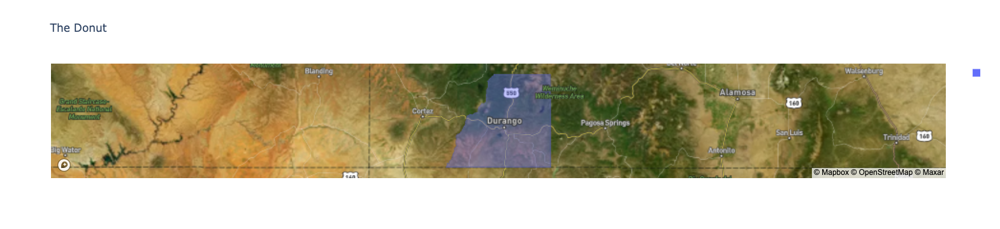

In [37]:
px.choropleth_mapbox(gdf_donut, 
                     geojson=gdf_donut.geometry, 
                     locations=gdf_donut.index, 
                     mapbox_style="satellite-streets",
                     zoom=7, 
                     center = {"lat": center_lat_donut, "lon": center_lon_donut},
                     hover_data=['County','FIPS','TotalPop','mines_count','mines_per_1000','mines_per_1000_lag'],
                     opacity=0.4,
                     title='The Donut')

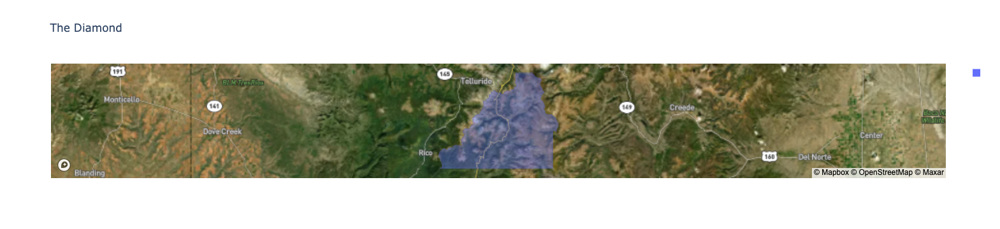

In [38]:
px.choropleth_mapbox(gdf_diamond, 
                     geojson=gdf_diamond.geometry, 
                     locations=gdf_diamond.index, 
                     mapbox_style="satellite-streets",
                     zoom=8, 
                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},
                     hover_data=['County','FIPS','TotalPop','mines_count','mines_per_1000','mines_per_1000_lag'],
                     opacity=0.4,
                     title='The Diamond')

My donut is La Plata, which is the county that includes Durango, a major tourist attraction town. Despite being surrounded by counties with a high mining presence, it has far less of a concentration of historic mines relative to the population. 

And my diamond is San Juan County! This is actually super interesting for me because this is where the town of Silverton that I have been working with for my internship is located. There are 257 total mines there, but given its very low total population (around 700), this means that there are 2379 mines were 100 people, with a spatial lag of 283 (also high). This means there are a ton of mines in this county, while its surrounding neighbors have far less of a mining presence. Since this is the town that inspired this whole research project that is great to know. Funnily enough, you can take the train from Durango to Silverton during the summer months, which is Silverton's main source of income.

## Spatial lag map

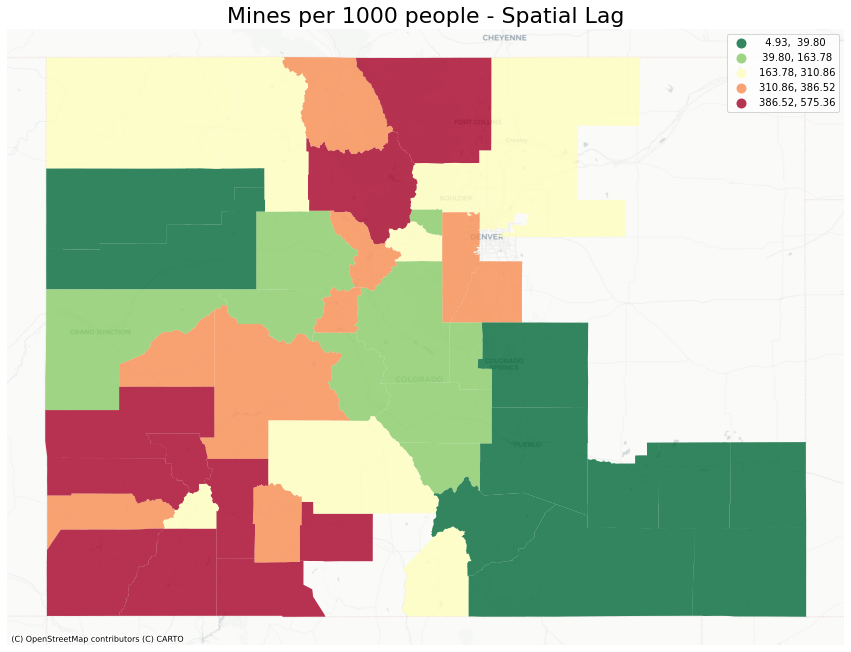

In [39]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf.plot(ax=ax,
         figsize=(15,15),
         column='mines_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='RdYlGn_r',
         scheme='quantiles')

ax.axis('off')
ax.set_title('Mines per 1000 people - Spatial Lag',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

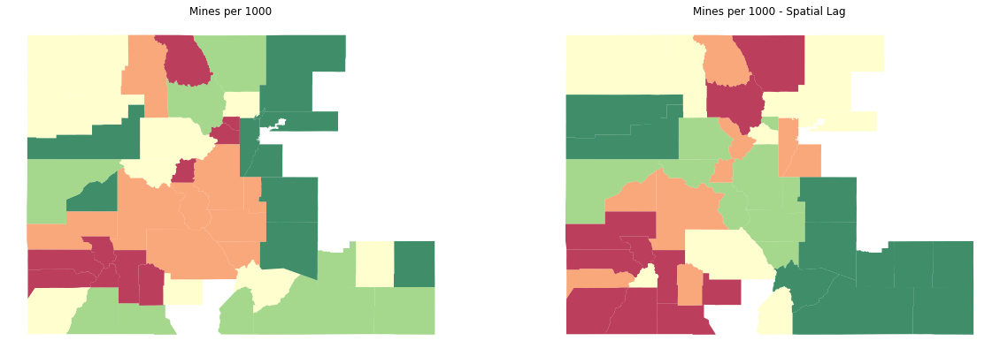

In [40]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='mines_per_1000', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Mines per 1000")

# spatial lag map on the right
gdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='mines_per_1000_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Mines per 1000 - Spatial Lag")

plt.show()

## Interactive Spatial Lag Map

In [41]:
# interactive version needs to be in WGS84
gdf_web = gdf.to_crs('EPSG:4326')

In [42]:
# what's the centroid?
minx, miny, maxx, maxy = gdf_web.geometry.total_bounds
center_lat_gdf_web = (maxy-miny)/2+miny
center_lon_gdf_web = (maxx-minx)/2+minx

In [43]:
# stats
gdf_web.mines_per_1000_lag.describe()

count     48.000000
mean     243.577038
std      178.262350
min        4.925326
25%       60.776608
50%      268.943026
75%      383.195350
max      575.357515
Name: mines_per_1000_lag, dtype: float64

In [44]:
# grab the median
median = gdf_web.mines_per_1000_lag.median()

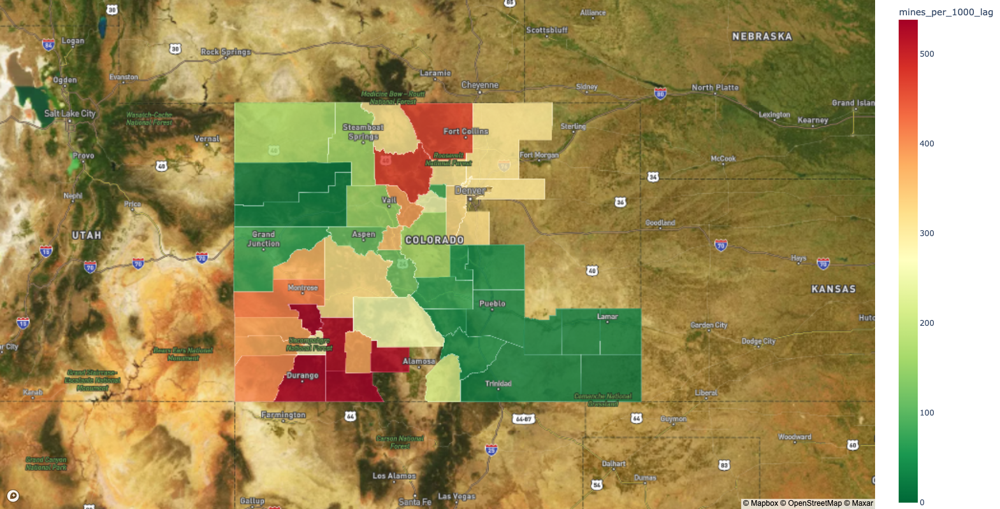

In [46]:
fig = px.choropleth_mapbox(gdf_web, 
                     geojson=gdf_web.geometry, # the geometry column
                     locations=gdf_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=6, 
                     color='mines_per_1000_lag',
                     color_continuous_scale='RdYlGn_r',
                     color_continuous_midpoint =median, # put the median as the midpoint
                     range_color =(0,median*2),
                     hover_data=['FIPS','County','TotalPop','mines_count','mines_per_1000','mines_per_1000_lag'],
                     center = {"lat": center_lat_gdf_web, "lon": center_lon_gdf_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'mines_per_100_lag':'Mines per 1000 (Spatial Lag)',
                             'mines_per_1000':'Mines per 1000',
                     })
fig.update_traces(marker_line_width=0.1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

## Spatial Autocorrelation Analysis

### Moran's Plot

In [47]:
y = gdf.mines_per_1000
moran = Moran(y, wq)
moran.I

0.0242963315528953

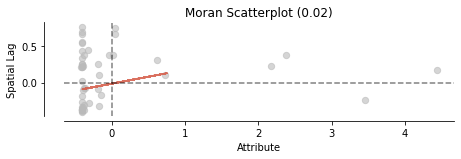

In [48]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

(<Figure size 504x504 with 1 Axes>,
 <AxesSubplot:title={'center':'Reference Distribution'}, xlabel='Moran I: 0.02', ylabel='Density'>)

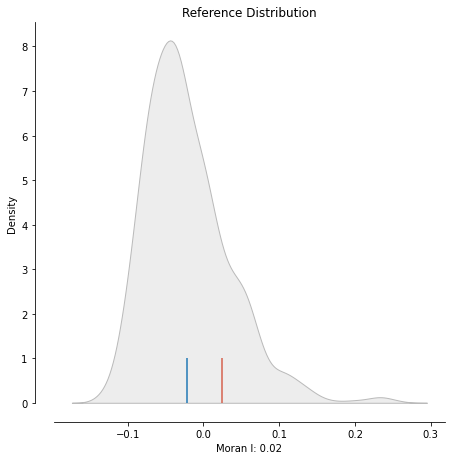

In [49]:
plot_moran_simulation(moran,aspect_equal=False)

In [50]:
moran.p_sim

0.184

With a p-value greather than 0.1 that is associated with a Moran's I of my map, I cannot reject the hypothesis that the map is random. From this simulation, I cannot conclude that there is a spatial pattern to the historic mine data, but rather the distribution of mines is fairly random. 

### Local Spatial Autocorrelation

In [51]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

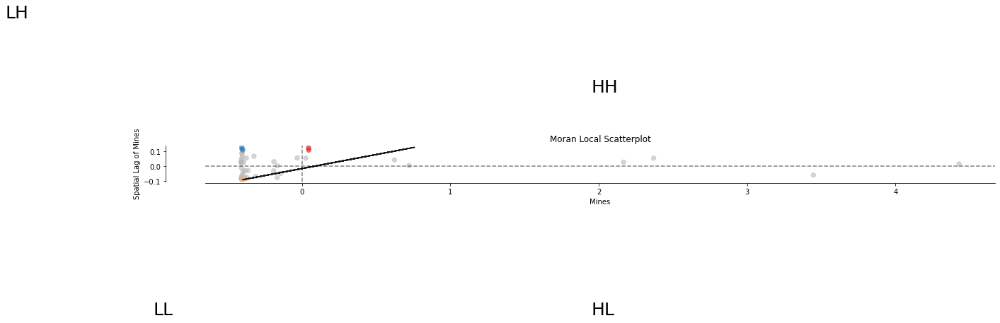

In [52]:
# Plot
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Mines")
ax.set_ylabel('Spatial Lag of Mines')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

In the scatterplot above, the colored dots represents the rows (counties) that have a P-value less that 0.05 in each quadrant. In other words, these are the statisticaly significantly, spatially autocorrelated geographies (which for this analysis there are very few of).

## Mapping Spatial Autocorrelation

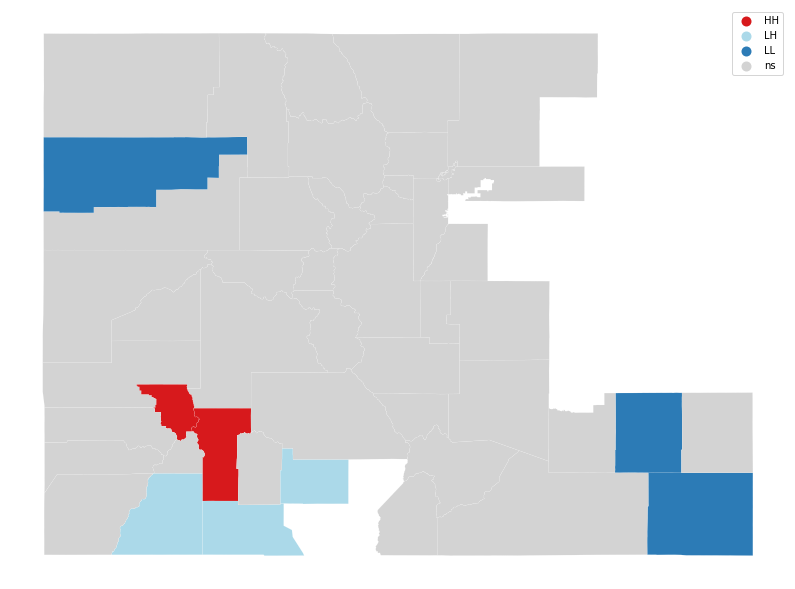

In [53]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf, p=0.05, ax=ax)
plt.show()

### Map comparing p-values

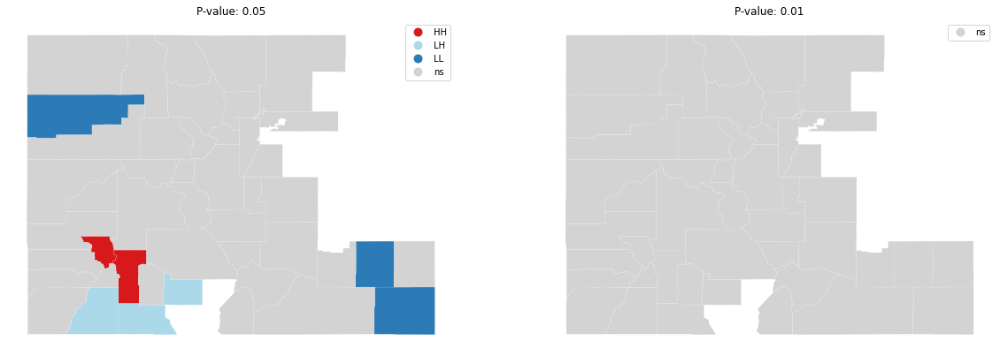

In [54]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(20, 12))

# regular count map on the left
lisa_cluster(lisa, gdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

Using a lower p-value revealed only one county, while the higher p-value still is showing very little spatial autocorrelation. I assume this has to do with the extremely high value of mines across the whole state. There aren't a lot of statistically significant spatial clusters, but I am interested in the HH values that appear higher in the Southwest part of the state (a very isolated and scenic area with lots of tourism-dependent towns, which is relevant to my project). 


I am glad I went through it for the purposes of trying to better understand spatial autocorrelation. I will start doing some more research into different data and scales of analysis for my project this week, but this was a useful exercise! I also found the diamond and the donut portion to be very useful in identifying two counties that have been of interest to me since I started this project.